## Pemahaman data

Import yang dibutuhkan

In [217]:
!pip install squarify

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from datetime import timedelta
import squarify
import warnings
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
#
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score , silhouette_samples
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from scipy.stats import norm
import matplotlib.pyplot as plt
%matplotlib inline

# hierarchical Clustering libraries
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
%matplotlib inline

# Importing plotly and cufflinks in offline mode
import plotly.offline
import plotly.graph_objects as go

# Setting Configurations:
pd.set_option("display.max_rows", None,"display.max_columns", None)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Import Warnings:

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
plt.style.use('seaborn')


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Membaca Dataset

In [218]:
df = pd.read_csv('dataset-inisialisasi.csv')
df.head()

,ID,Quantity,UnitPrice,Invoice,Date
0,1230002,2.000,45000.000,INV88122022,01/01/2021
1,1230001,1.000,70000.000,INV92092022,29/09/2021
2,1230005,25.000,3660000.000,INV70122022,20/12/2021
3,1230088,5.000,1000000.000,INV05122021,20/12/2021
4,1230003,49.000,4445000.000,INV92122022,29/12/2021


In [219]:
# melihat dimensi dataset
df.shape

(1799, 5)

In [220]:
# basicsof the df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1799 entries, 0 to 1798
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         1799 non-null   int64  
 1   Quantity   1798 non-null   float64
 2   UnitPrice  1798 non-null   float64
 3   Invoice    1799 non-null   object 
 4   Date       1799 non-null   object 
dtypes: float64(2), int64(1), object(2)
memory usage: 70.4+ KB


In [221]:
##df['Quantity'] = df['Quantity'].astype('Int64')
##df['UnitPrice'] = df['UnitPrice'].astype('Int64')

Menghitung persentase nilai null dalam setiap kolom DataFrame df.

In [222]:
round(100*(df.isnull().sum())/len(df), 2)

ID          0.000
Quantity    0.060
UnitPrice   0.060
Invoice     0.000
Date        0.000
dtype: float64

## Data Preparation

Data Cleaning

Menghapus baris-baris dari DataFrame df yang mengandung nilai-nilai yang hilang (NaN/null)

In [223]:
df.dropna(inplace=True)

In [224]:
round(100*(df.isnull().sum())/len(df), 2)

ID          0.000
Quantity    0.000
UnitPrice   0.000
Invoice     0.000
Date        0.000
dtype: float64

In [225]:
df.shape

(1798, 5)

Data Selection

Mengubah tipe data dari kolom 'ID' menjadi tipe data string ('str') dan kolom 'Date' menjadi tipe data datetime

In [226]:
df['ID'] = df['ID'].astype('str')
df['Date'] = pd.to_datetime(df['Date'],infer_datetime_format=True)

Menambahkan kolom baru bernama 'Amount' ke dalam DataFrame df. Kolom 'Amount' diisi dengan hasil perkalian antara kolom 'Quantity' dan kolom 'UnitPrice'

In [227]:
df['Amount'] = df['Quantity'] * df['UnitPrice']
df.head()

,ID,Quantity,UnitPrice,Invoice,Date,Amount
0,1230002,2.000,45000.000,INV88122022,2021-01-01,90000.000
1,1230001,1.000,70000.000,INV92092022,2021-09-29,70000.000
2,1230005,25.000,3660000.000,INV70122022,2021-12-20,91500000.000
3,1230088,5.000,1000000.000,INV05122021,2021-12-20,5000000.000
4,1230003,49.000,4445000.000,INV92122022,2021-12-29,217805000.000


Data Transformation

Menghitung metrik RFM

In [228]:
df.head()

,ID,Quantity,UnitPrice,Invoice,Date,Amount
0,1230002,2.000,45000.000,INV88122022,2021-01-01,90000.000
1,1230001,1.000,70000.000,INV92092022,2021-09-29,70000.000
2,1230005,25.000,3660000.000,INV70122022,2021-12-20,91500000.000
3,1230088,5.000,1000000.000,INV05122021,2021-12-20,5000000.000
4,1230003,49.000,4445000.000,INV92122022,2021-12-29,217805000.000


Monetary - total or average amount spent dari customer

Menghasilkan DataFrame baru yang berisi informasi tentang total jumlah yang dihabiskan oleh setiap pelanggan (berdasarkan nilai unik dari kolom 'ID') dalam kolom yang dinamakan 'Monetary'. Hal ini membantu dalam menganalisis pola pengeluaran atau pendapatan dari masing-masing pelanggan dalam dataset.

In [229]:
# Calculating monetary attribute
cus_data = df.groupby('ID')[['Amount']].sum() # Total Amount spent
cus_data.rename(columns={'Amount' : 'Monetary'},inplace=True)
cus_data.head()

,Monetary
ID,
1230001,905000.000
1230002,4833000.000
1230003,435610000.000
1230004,28800000.000
1230005,220728000.000


In [230]:
cus_data.to_excel("Monetary.xlsx")

Frequency = Menambahkan kolom baru 'Frequency' ke DataFrame cus_data yang berisi jumlah frekuensi atau berapa kali transaksi ('Invoice') terjadi untuk setiap nilai unik dalam kolom 'ID'. Ini membantu dalam memahami seberapa sering pelanggan melakukan transaksi atau aktivitas tertentu dalam dataset.

In [231]:
# Calculating frequency attribute
cus_data['Frequency'] = df.groupby('ID')['Invoice'].count()
cus_data.head()

,Monetary,Frequency
ID,,
1230001,905000.000,3
1230002,4833000.000,4
1230003,435610000.000,2
1230004,28800000.000,2
1230005,220728000.000,15


Recency - Waktu sejak pemesanan terakhir atau interaksi dengan produk

Menemukan tanggal terbaru (tanggal maksimum) dalam kolom 'Date'

In [232]:
max_date = max(df['Date'])
max_date

Timestamp('2023-12-10 00:00:00')

Membuat kolom baru bernama 'diff'. Kolom 'diff' akan berisi selisih antara tanggal maksimum (max_date) dan setiap nilai dalam kolom 'Date'

In [233]:
df['diff'] = max_date - df['Date']
df.head()

,ID,Quantity,UnitPrice,Invoice,Date,Amount,diff
0,1230002,2.000,45000.000,INV88122022,2021-01-01,90000.000,1073 days
1,1230001,1.000,70000.000,INV92092022,2021-09-29,70000.000,802 days
2,1230005,25.000,3660000.000,INV70122022,2021-12-20,91500000.000,720 days
3,1230088,5.000,1000000.000,INV05122021,2021-12-20,5000000.000,720 days
4,1230003,49.000,4445000.000,INV92122022,2021-12-29,217805000.000,711 days


Menambahkan atribut "Recency" ke dalam DataFrame cus_data, yang menunjukkan seberapa "terkini" atau "baru" transaksi terakhir dari setiap pelanggan

In [234]:
import datetime as dt

cus_data['Recency'] = df.groupby('ID')['diff'].min().dt.days
cus_data = cus_data.reset_index()
cus_data.head(11)

,ID,Monetary,Frequency,Recency
0,1230001,905000.000,3,137
1,1230002,4833000.000,4,258
2,1230003,435610000.000,2,346
3,1230004,28800000.000,2,343
4,1230005,220728000.000,15,70
5,1230006,174170000.000,9,109
6,1230007,189442000.000,53,9
7,1230008,6783000.000,24,162
8,1230009,220000.000,2,284
9,1230010,2790000.000,5,162


Menghapus kolom ID

In [235]:
hasil = cus_data.drop(['ID'],axis=1)
hasil.head()

,Monetary,Frequency,Recency
0,905000.000,3,137
1,4833000.000,4,258
2,435610000.000,2,346
3,28800000.000,2,343
4,220728000.000,15,70


Menentukan angka maksimal dan minimal 

In [236]:
Mmax = hasil["Monetary"].max()
Mmax

956998712000.0

In [237]:
Mmin = hasil["Monetary"].min()
Mmin

15000.0

In [238]:
Fmax = hasil["Frequency"].max()
Fmax

53

In [239]:
Fmin = hasil["Frequency"].min()
Fmin

1

In [240]:
Rmax = hasil["Recency"].max()
Rmax

706

In [241]:
Rmin = hasil["Recency"].min()
Rmin

0

Featuring Scale = Melakukan penskalaan fitur pada data yang disimpan dalam variabel hasil

Membuat setiap fitur memiliki rentang yang serupa tanpa mengubah distribusi data.

In [242]:
min_max_scaler = MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(hasil)
mmhasil = pd.DataFrame(x_scaled)
mmhasil.head()

,0,1,2
0,0.000,0.038,0.194
1,0.000,0.058,0.365
2,0.000,0.019,0.490
3,0.000,0.019,0.486
4,0.000,0.269,0.099


In [243]:
mmhasil.columns = ['Monetary', 'Frequency', 'Recency']
mmhasil.head()

,Monetary,Frequency,Recency
0,0.000,0.038,0.194
1,0.000,0.058,0.365
2,0.000,0.019,0.490
3,0.000,0.019,0.486
4,0.000,0.269,0.099


Treating Outliers

Visualisasi berupa boxplot untuk masing-masing fitur numerik dalam DataFrame cus_data, yang membantu dalam melihat distribusi, outlier, dan perbandingan antara berbagai atribut numerik yang terkait dengan perilaku atau karakteristik pelanggan.

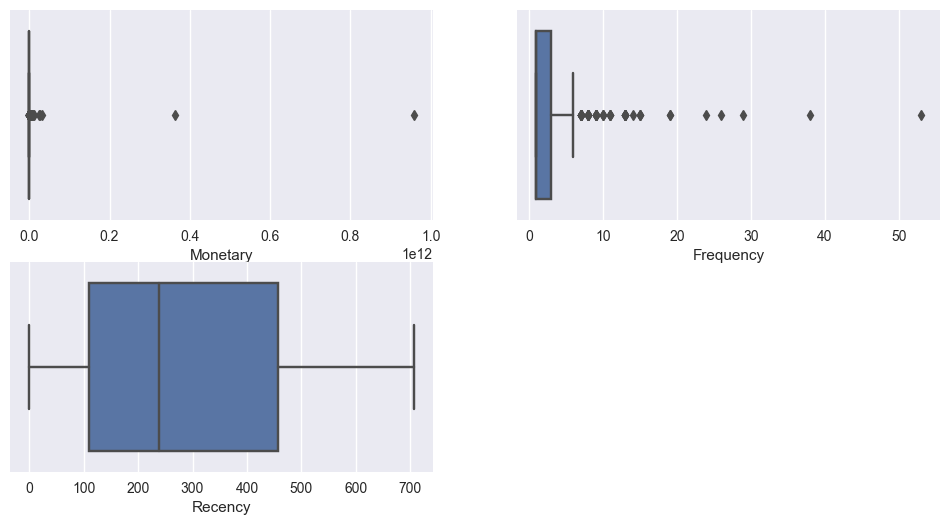

In [244]:
num_features = cus_data.columns[1:]
r = c = 0
fig,ax = plt.subplots(2,2,figsize=(12,6))

for n,i in enumerate(num_features):
    sns.boxplot(x=i, data=cus_data,ax=ax[r,c])
    c+=1
    if (n+1)%2==0:
        r+=1
        c=0
ax[r,c].axis("off")
plt.show()

Berdasarkan box plot di atas terlihat bahwa atribut Monetary mempunyai outlier. Karena algoritme pengelompokan seperti K-means rentan terhadap outlier, saya akan menanganinya dengan membatasinya pada kuantil 95%.

Nilai-nilai 'Monetary' yang berada di luar rentang persentil ke-5 dan ke-95 akan dibatasi menjadi nilai dari persentil ke-5 dan ke-95, berturut-turut. Hal ini dapat membantu dalam mengatasi dampak dari outlier yang ekstrem pada analisis data, serta menjaga distribusi nilai 'Monetary' agar tetap relevan dalam rentang tertentu.

In [245]:
h_cap = 0.95
h_cap_val = cus_data['Monetary'].quantile(h_cap)
cus_data['Monetary'][cus_data['Monetary'] > h_cap_val] = h_cap_val
l_cap = 0.05
l_cap_val = cus_data['Monetary'].quantile(l_cap)
cus_data['Monetary'][cus_data['Monetary'] < l_cap_val] = l_cap_val

In [246]:
h_cap = 0.95
h_cap_val = cus_data['Monetary'].quantile(h_cap)
l_cap = 0.05
l_cap_val = cus_data['Monetary'].quantile(l_cap)

cus_data['Monetary'] = cus_data['Monetary'].clip(lower=l_cap_val, upper=h_cap_val)


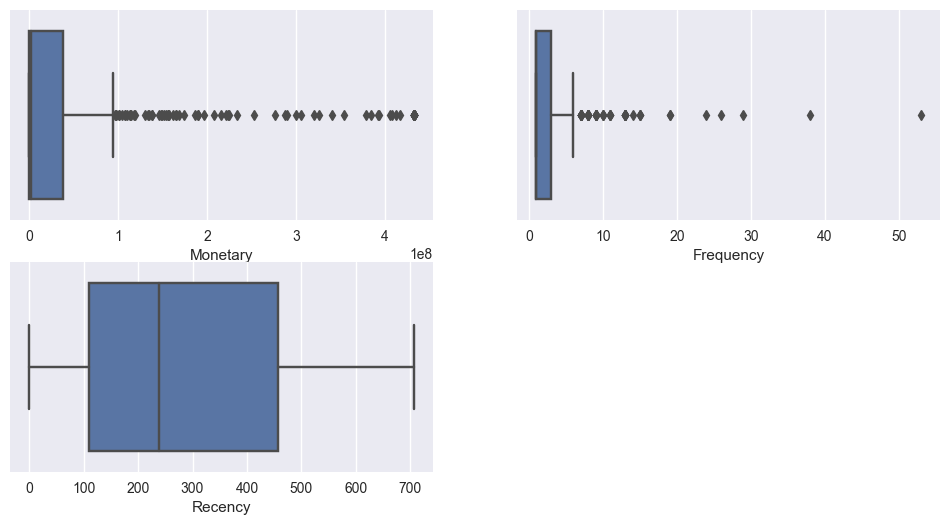

In [247]:
num_features = cus_data.columns[1:]
r = c = 0
fig,ax = plt.subplots(2,2,figsize=(12,6))

for n,i in enumerate(num_features):
    sns.boxplot(x=i, data=cus_data,ax=ax[r,c])
    c+=1
    if (n+1)%2==0:
        r+=1
        c=0
ax[r,c].axis("off")
plt.show()

Membuat pipeline for feature scaling & dimensionality reduction untuk membantu dalam mempermudah dan mengotomatiskan serangkaian transformasi data sebelum masuk ke dalam model.

In [248]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

preprocessor = Pipeline(
        [
            ("scaler", MinMaxScaler()),
            ("pca", PCA(n_components=2, random_state=42)),
        ]
    )

Mengaplikasikan pipeline preprocessor yang telah dibuat sebelumnya pada data cus_data untuk melakukan penskalaan dengan MinMaxScaler dan reduksi dimensi dengan PCA, dan kemudian menyimpan hasil transformasi tersebut ke dalam DataFrame X_scaled.

In [249]:
X = cus_data.drop('ID',axis=1)
X_scaled = pd.DataFrame(preprocessor.fit_transform(X),columns=['PC_1','PC_2'])

## Modelling 

Algoritma K-Means

Normalisasi Data RFM (Featuring Scale)

In [250]:
min_max_scaler = MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(X)
data_scaled2 = pd.DataFrame(x_scaled)
data_scaled2.head()

,0,1,2
0,0.002,0.038,0.194
1,0.011,0.058,0.365
2,1.000,0.019,0.490
3,0.067,0.019,0.486
4,0.511,0.269,0.099


In [251]:
data_scaled2.columns = ['Monetary', 'Frequency', 'Recency']
data_scaled2.head()

,Monetary,Frequency,Recency
0,0.002,0.038,0.194
1,0.011,0.058,0.365
2,1.000,0.019,0.490
3,0.067,0.019,0.486
4,0.511,0.269,0.099


Mencari nilai K yang optimal

Elbow Method = untuk membantu menentukan jumlah klaster yang optimal. Pada plot tersebut, penurunan nilai SSD akan menunjukkan seberapa baik data dapat dijelaskan oleh jumlah klaster tertentu. Pada titik di mana penurunan nilai SSD mulai melambat secara signifikan (menyerupai bentuk "siku" atau "elbow"), itulah jumlah klaster yang sering dipilih sebagai jumlah klaster yang optimal.

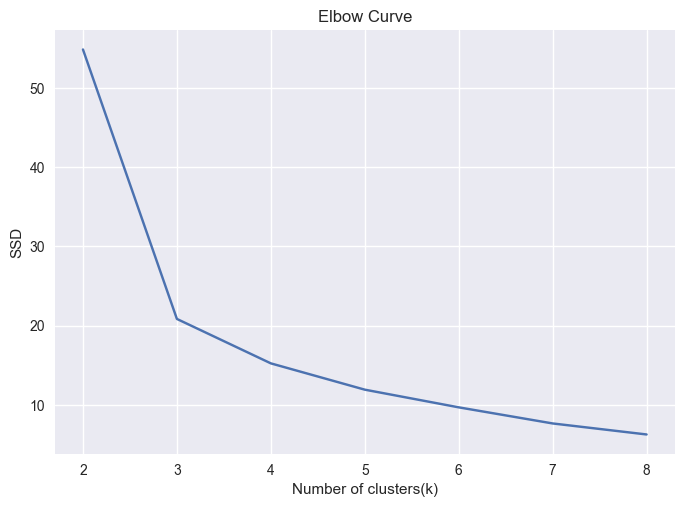

In [252]:
# elbow-curve/SSD
ssd = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(X_scaled)
    ssd.append(kmeans.inertia_)

plt.plot(range_n_clusters,ssd)
plt.xlabel('Number of clusters(k)')
plt.ylabel('SSD')
plt.title('Elbow Curve')
plt.show()

Berdasarkan kurva "elbow" di atas, k=3 tampaknya merupakan jumlah cluster yang optimal.

Silhouette Coefficient

Silhouette Analysis = Untuk memberikan informasi tentang bagaimana nilai Silhouette Score bervariasi untuk berbagai jumlah klaster yang berbeda. Hal ini membantu dalam mengevaluasi performa algoritma KMeans dan memilih jumlah klaster yang optimal berdasarkan nilai Silhouette Score yang paling tinggi.

In [253]:
# silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(X_scaled)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, round(silhouette_avg,2)))

For n_clusters=2, the silhouette score is 0.5
For n_clusters=3, the silhouette score is 0.6
For n_clusters=4, the silhouette score is 0.52
For n_clusters=5, the silhouette score is 0.52
For n_clusters=6, the silhouette score is 0.52
For n_clusters=7, the silhouette score is 0.51
For n_clusters=8, the silhouette score is 0.52


Untuk memberikan visualisasi yang menggambarkan seberapa baik setiap sampel data ditempatkan dalam klasternya. Area di dalam plot diisi dengan warna yang berbeda untuk setiap klaster, sementara garis vertikal menunjukkan rata-rata dari nilai Silhouette Score. Plot ini membantu dalam evaluasi visual dari seberapa baik klasterisasi telah dilakukan serta seberapa baik setiap sampel cocok ke dalam klasternya.

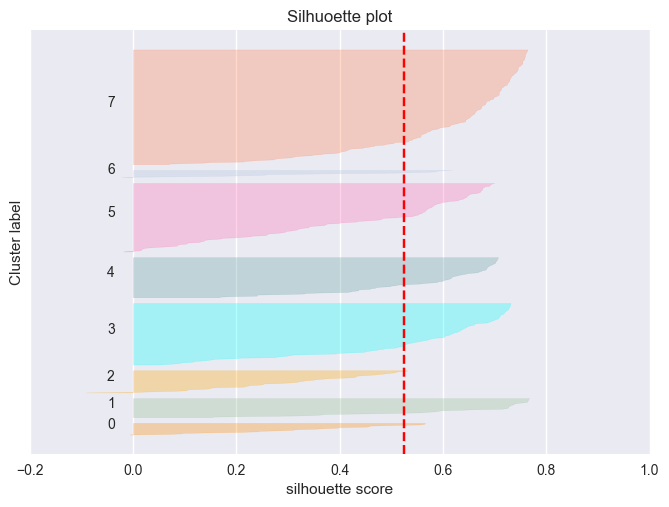

In [254]:
colorlist =["darkorange", "darkseagreen", "orange", "cyan", "cadetblue", "hotpink", "lightsteelblue", "coral",  "mediumaquamarine"]
each_silhouette_score = silhouette_samples(X_scaled,cluster_labels,metric="euclidean")
fig =plt.figure()
ax = fig.add_subplot(1,1,1)
y_lower =10
for i in range(num_clusters):
    ith_cluster_silhouette_values = each_silhouette_score[cluster_labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = colorlist[i]
    ax.fill_betweenx(np.arange(y_lower,y_upper),0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.3)
    
    #label the silhouse plots with their cluster numbers at the middle
    ax.text(-0.05,y_lower + 0.5 * size_cluster_i,str(i))
    
    #compute the new y_lower for next plot
    y_lower = y_upper +10 
    
ax.set_title("Silhuoette plot")
ax.set_xlabel("silhouette score")
ax.set_ylabel("Cluster label")
    
#the vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg,color="red",linestyle="--")
    
ax.set_yticks([])
ax.set_xticks([-0.2,0,0.2,0.4,0.6,0.8,1])


- Semakin tinggi nilai Silhouette Score, semakin baik sampel tersebut cocok dalam klasternya sendiri dan berjarak cukup jauh dari klaster lain. Nilai yang mendekati 1 menunjukkan bahwa sampel tersebut ditempatkan dengan baik dalam klasternya.
- Semakin tinggi bar, semakin tinggi nilai Silhouette Score.

Jika mayoritas bar memiliki tinggi yang serupa dan nilai Silhouette Score mendekati 1, itu menunjukkan bahwa klasterisasi berhasil dalam memisahkan kelompok data dengan baik.


In [255]:
from sklearn.metrics import silhouette_score
sse_ = []
for k in range(2,8):
    kmeans = KMeans(n_clusters=k).fit(X_scaled)
    sse_.append([k, silhouette_score(X_scaled, kmeans.labels_)])

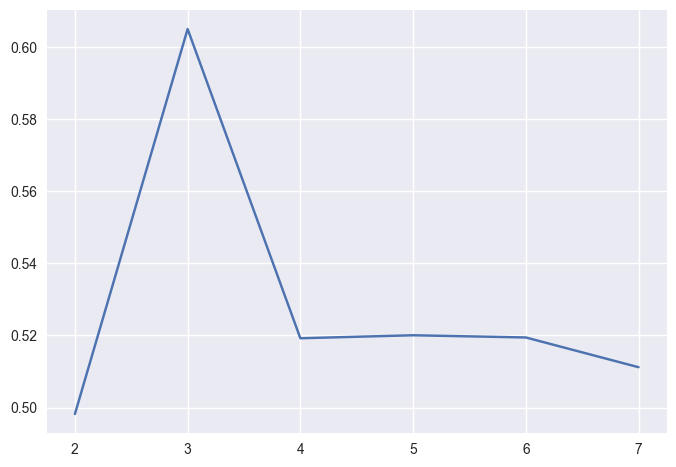

In [256]:
plt.plot(pd.DataFrame(sse_)[0], pd.DataFrame(sse_)[1]);

Visualization K-Means

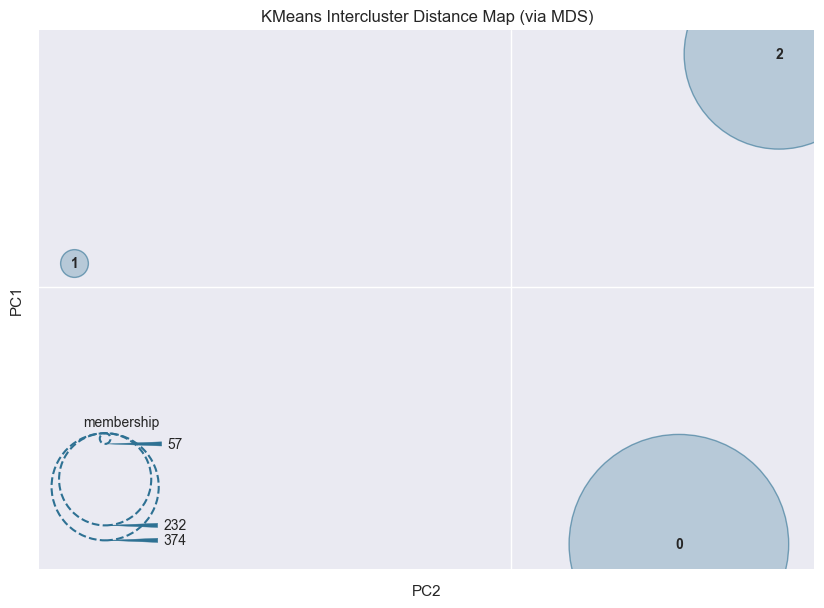

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [257]:
from yellowbrick.cluster import InterclusterDistance
plt.rcParams["figure.figsize"] = (10, 7)

# Instantiate the clustering model and visualizer
model = KMeans(3)
visualizer = InterclusterDistance(model)

visualizer.fit(X_scaled)  # Fit the data to the visualizer
visualizer.show()

## RFM

Membuat 4 Quartal = berguna untuk memahami distribusi data pada titik-titik tertentu dalam dataset, seperti untuk menentukan rentang-nilai dari beberapa pecahan data tertentu. 

In [258]:
quantiles = cus_data.quantile(q=[0.20,0.40,0.60,0.80])
quantiles

,Monetary,Frequency,Recency
0.200,200000.000,1.000,89.200
0.400,879600.000,1.000,156.400
0.600,6790400.000,2.000,306.600
0.800,54298000.000,3.000,484.000


Mengkonversi DataFrame quantiles yang berisi nilai kuantil pada persentil tertentu menjadi bentuk kamus (dictionary).

In [259]:
quantiles.to_dict()

{'Monetary': {0.2: 200000.0,
  0.4: 879600.0,
  0.6: 6790400.0,
  0.8: 54298000.00000002},
 'Frequency': {0.2: 1.0, 0.4: 1.0, 0.6: 2.0, 0.8: 3.0},
 'Recency': {0.2: 89.20000000000002,
  0.4: 156.40000000000003,
  0.6: 306.5999999999999,
  0.8: 484.0}}

Scoring R & FM = untuk memberikan skor pada data pelanggan berdasarkan nilai-nilai Recency, Frequency, dan Monetary yang mereka miliki. Skor ini dapat membantu dalam segmentasi pelanggan atau dalam mengklasifikasikan pelanggan ke dalam kategori-kategori berbeda berdasarkan karakteristik transaksi mereka.

In [260]:
# Argumen (x = nilai, p = recency, monetary, frequency, d = quartiles dict)
def RScore(x,p,d):
    if x <= d[p][0.20]:
        return 1
    elif x <= d[p][0.40]:
        return 2
    elif x <= d[p][0.60]: 
        return 3
    elif x <= d[p][0.80]:
        return 4
    else:
        return 5
    
# Argumen (x = nilai, p = recency, monetary, frequency, k = quartiles dict)
def FMScore(x,p,d):
    if x <= d[p][0.20]:
        return 1
    elif x <= d[p][0.40]:
        return 2
    elif x <= d[p][0.60]: 
        return 3
    elif x <= d[p][0.80]:
        return 4
    else:
        return 5

Menghitung Nilai Recency Frequency dan Monetary

Penambahan tiga kolom baru ('Recency_Score', 'Frequency_Score', dan 'Monetary_Score') ke dalam DataFrame cus_data yang berisi skor-skor yang dihasilkan berdasarkan klasifikasi nilai-nilai Recency, Frequency, dan Monetary dari setiap pelanggan.

In [261]:
cus_data['Recency_Score'] = cus_data['Recency'].apply(RScore, args=('Recency',quantiles,))
cus_data['Frequency_Score'] = cus_data['Frequency'].apply(FMScore, args=('Frequency',quantiles,))
cus_data['Monetary_Score'] = cus_data['Monetary'].apply(FMScore, args=('Monetary',quantiles,))

In [262]:
cus_data.head()

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score
0,1230001,905000.000,3,137,2,4,3
1,1230002,4833000.000,4,258,3,5,3
2,1230003,431943000.000,2,346,4,3,5
3,1230004,28800000.000,2,343,4,3,4
4,1230005,220728000.000,15,70,1,5,5


Menggabungkan Nilai Recency_Score Frequency_Score Monetary_Score menjadi RFM Score

In [263]:
cus_data['RFM Score'] = (cus_data['Recency_Score'].astype(str) +
                    cus_data['Frequency_Score'].astype(str) + cus_data['Monetary_Score'].astype(str))

cus_data.head() 

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score
0,1230001,905000.000,3,137,2,4,3,243
1,1230002,4833000.000,4,258,3,5,3,353
2,1230003,431943000.000,2,346,4,3,5,435
3,1230004,28800000.000,2,343,4,3,4,434
4,1230005,220728000.000,15,70,1,5,5,155


Menghitung Total Nilai RScore + FScore + MScore menjadi RFM SUM

In [264]:
cus_data['RFM_Sum'] = cus_data[['Recency_Score','Frequency_Score','Monetary_Score']].sum(axis=1)
cus_data.head()

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum
0,1230001,905000.000,3,137,2,4,3,243,9
1,1230002,4833000.000,4,258,3,5,3,353,11
2,1230003,431943000.000,2,346,4,3,5,435,12
3,1230004,28800000.000,2,343,4,3,4,434,11
4,1230005,220728000.000,15,70,1,5,5,155,11


RFM Segmentation

Penambahan kolom baru 'RFM Segmentasi' yang akan menunjukkan segmentasi pelanggan berdasarkan skor RFM yang telah dihitung sebelumnya. Setiap baris akan memiliki kategori 'Highest Loyalty', 'Medium Loyalty', atau 'Low Loyalty' berdasarkan skor RFM yang dihitung.

In [265]:
segments = {'Customer_Segment' : [ 'Lost customers',
                                    'Hibernating customers',
                                    'Cannot Lose Them',
                                    'At Risk',
                                    'About To Sleep',
                                    'Need Attention',
                                    'Promising',
                                    'New Customers',
                                    'Potential Loyalist',
                                    'Loyal',
                                    'Champions'],
            'RFM' : ['(1)-(1)-(1)|(1)-(1)-(2)|(1)-(2)-(1)|(1)-(3)-(1)|(1)-(4)-(1)|(1)-(5)-(1)',
                     '(3)-(3)-(2)|(3)-(2)-(2)|(2)-(3)-(3)|(2)-(3)-(2)|(2)-(2)-(3)|(2)-(2)-(2)|(1)-(3)-(2)|(1)-(2)-(3)|(1)-(2)-(2)|(2)-(1)-(2)|(2)-(1)-(1)',
                     '(1)-(5)-(5)|(1)-(5)-(4)|(1)-(4)-(4)|(2)-(1)-(4)|(2)-(1)-(5)|(1)-(1)-(5)|(1)-(1)-(4)|(1)-(1)-(3)',
                     '(2)-(5)-(5)|(2)-(5)-(4)|(2)-(4)-(5)|(2)-(4)-(4)|(2)-(5)-(3)|(2)-(5)-(2)|(2)-(4)-(3)|(2)-(4)-(2)|(2)-(3)-(5)|(2)-(3)-(4)|(2)-(2)-(5)|(2)-(2)-(4)|(1)-(5)-(3)|(1)-(5)-(2)|(1)-(4)-(5)|(1)-(4)-(3)|(1)-(4)-(2)|(1)-(3)-(5)|(1)-(3)-(4)|(1)-(3)-(3)|(1)-(2)-(5)|(1)-(2)-(4)',
                     '(3)-(3)-(1)|(3)-(2)-(1)|(3)-(1)-(2)|(2)-(2)-(1)|(2)-(1)-(3)|(2)-(3)-(1)|(2)-(4)-(1)|(2)-(5)-(1)',
                     '(5)-(3)-(5)|(5)-(3)-(4)|(4)-(4)-(3)|(4)-(3)-(4)|(3)-(4)-(3)|(3)-(3)-(4)|(3)-(2)-(5)|(3)-(2)-(4)',
                     '(5)-(2)-(5)|(5)-(2)-(4)|(5)-(2)-(3)|(5)-(2)-(2)|(5)-(2)-(1)|(5)-(1)-(5)|(5)-(1)-(4)|(5)-(1)-(3)|(4)-(2)-(5)|(4)-(2)-(4)|(4)-(1)-(3)|(4)-(1)-(4)|(4)-(1)-(5)|(3)-(1)-(5)|(3)-(1)-(4)|(3)-(1)-(3)',
                     '(5)-(1)-(2)|(5)-(1)-(1)|(4)-(2)-(2)|(4)-(2)-(1)|(4)-(1)-(2)|(4)-(1)-(1)|(3)-(1)-(1)',
                     '(5)-(5)-(3)|(5)-(5)-(1)|(5)-(5)-(2)|(5)-(4)-(1)|(5)-(4)-(2)|(5)-(3)-(3)|(5)-(3)-(2)|(5)-(3)-(1)|(4)-(5)-(2)|(4)-(5)-(1)|(4)-(4)-(2)|(4)-(4)-(1)|(4)-(3)-(1)|(4)-(5)-(3)|(4)-(3)-(3)|(4)-(3)-(2)|(4)-(2)-(3)|(3)-(5)-(3)|(3)-(5)-(2)|(3)-(5)-(1)|(3)-(4)-(2)|(3)-(4)-(1)|(3)-(3)-(3)|(3)-(2)-(3)',
                     '(5)-(4)-(3)|(4)-(4)-(4)|(4)-(3)-(5)|(3)-(5)-(5)|(3)-(5)-(4)|(3)-(4)-(5)|(3)-(4)-(4)|(3)-(3)-(5)',
                     '(5)-(5)-(5)|(5)-(5)-(4)|(5)-(4)-(4)|(5)-(4)-(5)|(4)-(5)-(4)|(4)-(5)-(5)|(4)-(4)-(5)']}

In [266]:
pd.DataFrame(segments)

,Customer_Segment,RFM
0,Lost customers,(1)-(1)-(1)|(1)-(1)-(2)|(1)-(2)-(1)|(1)-(3)-(1...
1,Hibernating customers,(3)-(3)-(2)|(3)-(2)-(2)|(2)-(3)-(3)|(2)-(3)-(2...
2,Cannot Lose Them,(1)-(5)-(5)|(1)-(5)-(4)|(1)-(4)-(4)|(2)-(1)-(4...
3,At Risk,(2)-(5)-(5)|(2)-(5)-(4)|(2)-(4)-(5)|(2)-(4)-(4...
4,About To Sleep,(3)-(3)-(1)|(3)-(2)-(1)|(3)-(1)-(2)|(2)-(2)-(1...
5,Need Attention,(5)-(3)-(5)|(5)-(3)-(4)|(4)-(4)-(3)|(4)-(3)-(4...
6,Promising,(5)-(2)-(5)|(5)-(2)-(4)|(5)-(2)-(3)|(5)-(2)-(2...
7,New Customers,(5)-(1)-(2)|(5)-(1)-(1)|(4)-(2)-(2)|(4)-(2)-(1...
8,Potential Loyalist,(5)-(5)-(3)|(5)-(5)-(1)|(5)-(5)-(2)|(5)-(4)-(1...
9,Loyal,(5)-(4)-(3)|(4)-(4)-(4)|(4)-(3)-(5)|(3)-(5)-(5...


In [267]:
def categorizer(rfm):
    
    if (rfm[:3] in ['111', '112', '121', '131', '141', '151']) :
        rfm = 'Lost Customers'
        
    elif (rfm[:3] in ['332', '322', '233', '232', '223', '222', '132', '123', '122', '212', '212', '211']) :
        rfm = 'Hibernating Customers'
        
    elif (rfm[:3] in ['155', '154', '144', '214', '215','115','114','113']) :
        rfm = 'Cannot Lose Them'
    
    elif (rfm[:3] in ['255','254','245','244','253','252','243','242','235','234','225','224','153','152','145','143','142','135','134','133','125','124']) :
        rfm = 'At Risk'
    
    elif (rfm[:3] in ['331','321','312','221','213','231','241','251']) :
        rfm = 'About To Sleep'
    
    elif (rfm[:3] in ['535', '534','443','434','343','334','325','324']) :
        rfm = 'Need Attention'    
   
    elif (rfm[:3] in ['525', '524','523','522','521','515','514','513','425','424','413','414','415','315','314','313']) :
        rfm = 'Promissing'
    
    elif (rfm[:3] in ['512','511','422','421','412','411','311']) :
        rfm = 'New Customers'
                
    elif (rfm[:3] in ['553','551','552','541','542','533','532','531','452','451','442','441','431','453','433','432','423','353','352','351','342','341','333','323']) :
        rfm = 'Potential Loyalist'
    
    elif (rfm[:3] in ['543','444','435','355','354','345','344','335']) :
        rfm = 'Loyal'

    elif (rfm[:3] in ['555','554','544','545','454','455','445']) :
        rfm = 'Campions'

    return rfm 

In [268]:
cus_data['Customer_Category'] = cus_data["RFM Score"].apply(categorizer)
cus_data.sample(10)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category
651,1231754,431943000.000,1,61,1,1,5,115,7,Cannot Lose Them
206,1230387,32580000.000,4,258,3,5,4,354,12,Loyal
168,1230315,6768500.000,2,576,5,3,3,533,11,Potential Loyalist
102,1230172,400000.000,2,530,5,3,2,532,10,Potential Loyalist
472,1231213,1925000.000,1,255,3,1,3,313,7,Promissing
375,1230872,60000.000,1,407,4,1,1,411,6,New Customers
588,1231566,925000.000,2,81,1,3,3,133,7,At Risk
2,1230003,431943000.000,2,346,4,3,5,435,12,Loyal
418,1231074,107610000.000,1,314,4,1,5,415,10,Promissing
494,1231272,224370000.000,2,280,3,3,5,335,11,Loyal


In [269]:
cus_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663 entries, 0 to 662
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 663 non-null    object 
 1   Monetary           663 non-null    float64
 2   Frequency          663 non-null    int64  
 3   Recency            663 non-null    int64  
 4   Recency_Score      663 non-null    int64  
 5   Frequency_Score    663 non-null    int64  
 6   Monetary_Score     663 non-null    int64  
 7   RFM Score          663 non-null    object 
 8   RFM_Sum            663 non-null    int64  
 9   Customer_Category  663 non-null    object 
dtypes: float64(1), int64(6), object(3)
memory usage: 51.9+ KB


In [270]:
cus_data["Customer_Category"].value_counts()

New Customers            114
Promissing               102
At Risk                   89
Cannot Lose Them          80
Potential Loyalist        75
Hibernating Customers     62
Loyal                     35
Need Attention            35
About To Sleep            28
Lost Customers            28
Campions                  15
Name: Customer_Category, dtype: int64

In [271]:
cust_cat_agg = cus_data.groupby('Customer_Category').agg({
    'Recency' : 'mean',
    'Frequency' : 'mean',
    'Monetary' : ['mean','count']
}).round(1)
# print the aggregated dataset
print(cust_cat_agg)

                      Recency Frequency      Monetary      
                         mean      mean          mean count
Customer_Category                                          
About To Sleep        178.200     1.200    802500.000    28
At Risk                91.000     4.400  65444847.200    89
Campions              393.300     5.400 124818733.300    15
Cannot Lose Them       62.100     6.300 133007103.700    80
Hibernating Customers 123.500     1.400    609104.800    62
Lost Customers         53.700     1.200    229297.100    28
Loyal                 272.600     3.300 186850314.300    35
Need Attention        357.400     2.200  30046685.700    35
New Customers         477.800     1.000    191157.900   114
Potential Loyalist    382.400     3.500   1838340.000    75
Promissing            443.200     1.000  77133578.400   102


In [272]:
Avg_RFM_Sum = cus_data.groupby('Customer_Category').RFM_Sum.mean()
Size_RFM_Sum = cus_data['Customer_Category'].value_counts()
df_customer_segmentation = pd.concat([Avg_RFM_Sum, Size_RFM_Sum], axis=1).rename(columns={'RFM_Sum':'Avg_RFM_Sum',
                                                                           'Customer_Category':'Size_RFM_Sum'})
df_customer_segmentation

,Avg_RFM_Sum,Size_RFM_Sum
About To Sleep,6.107,28
At Risk,9.382,89
Campions,13.267,15
Cannot Lose Them,8.812,80
Hibernating Customers,5.452,62
Lost Customers,3.643,28
Loyal,11.914,35
Need Attention,10.857,35
New Customers,6.605,114
Potential Loyalist,10.080,75


Visualization RFM

Plot treemap yang mewakili segmentasi RFM ('Highest Loyalty', 'Medium Loyalty', 'Low Loyalty') berdasarkan jumlah pelanggan dalam setiap segmennya. Ukuran persegi panjang pada plot ini sesuai dengan jumlah pelanggan dalam masing-masing segmen RFM. Plot treemap ini memberikan visualisasi yang intuitif terkait proporsi atau distribusi jumlah pelanggan dalam setiap segmen RFM.

In [273]:
import plotly.express as px
fig = px.histogram(cus_data, 
                   x = cus_data['Customer_Category'].value_counts().index, 
                   y = cus_data['Customer_Category'].value_counts().values, 
                   title = 'The Size of RFM Label',
                   labels = dict(x = "Customer Segments (Categories)", y ="RFM Label Mean Values"))
fig.show()

In [274]:
import plotly.express as px

fig = px.treemap(df_customer_segmentation, 
                 path=[df_customer_segmentation.index], 
                 values='Size_RFM_Sum', 
                 width=950, height=600)

fig.update_layout(title_text='Customer Segmentation',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [275]:
## Create plot and resize
segmentation = pd.DataFrame(cus_data.Customer_Category.value_counts(dropna=False).sort_values(ascending=False))
segmentation.reset_index(inplace=True)
segmentation.rename(columns={'index':'Customer Category', 'Customer_Category':'The Number Of Customer'}, inplace=True)
segmentation

,Customer Category,The Number Of Customer
0,New Customers,114
1,Promissing,102
2,At Risk,89
3,Cannot Lose Them,80
4,Potential Loyalist,75
5,Hibernating Customers,62
6,Loyal,35
7,Need Attention,35
8,About To Sleep,28
9,Lost Customers,28


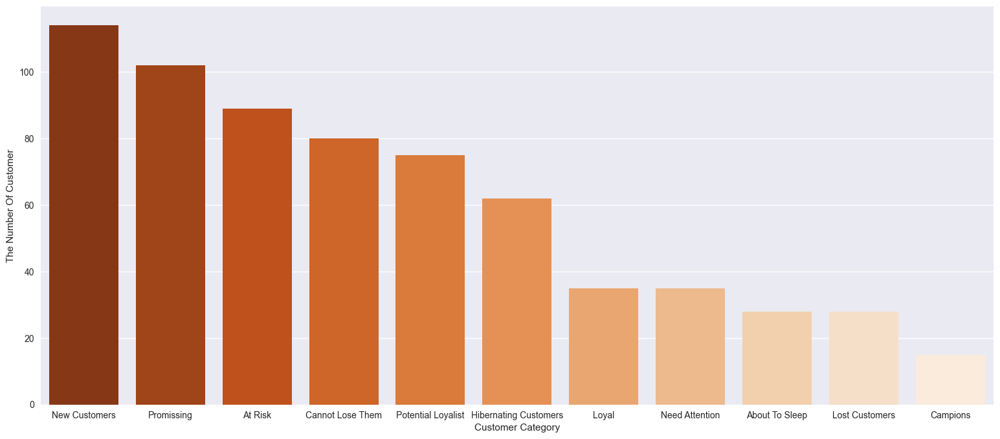

In [276]:
plt.figure(figsize=(19, 8))

sns.barplot(data=segmentation, x='Customer Category', y='The Number Of Customer', palette='Oranges_r');

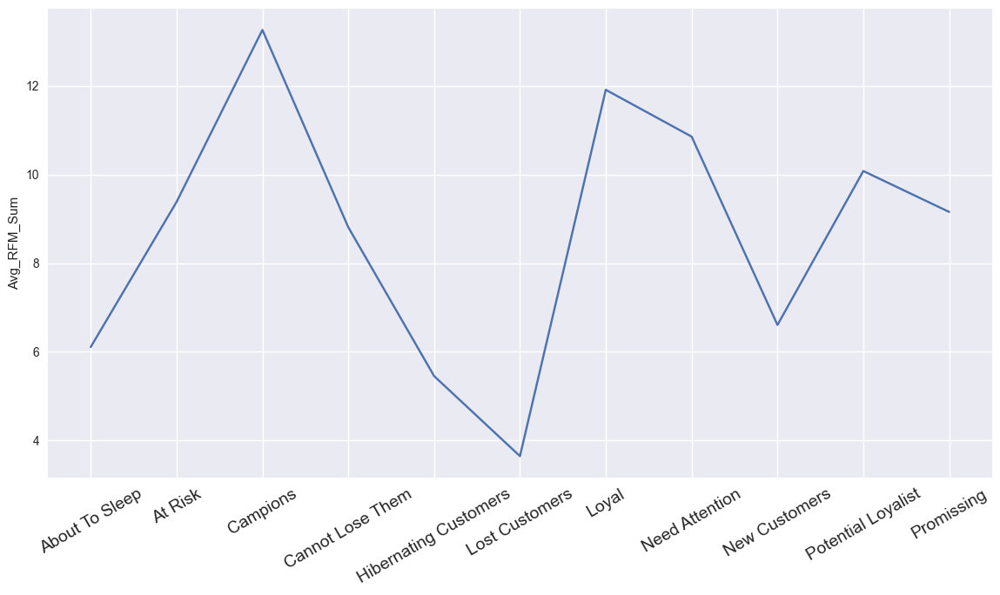

In [277]:
plt.figure(figsize=(14, 7))
sns.lineplot(x=df_customer_segmentation.index, y=df_customer_segmentation.Avg_RFM_Sum)
plt.xticks(rotation=30, fontsize=14);

In [278]:
segmentation

,Customer Category,The Number Of Customer
0,New Customers,114
1,Promissing,102
2,At Risk,89
3,Cannot Lose Them,80
4,Potential Loyalist,75
5,Hibernating Customers,62
6,Loyal,35
7,Need Attention,35
8,About To Sleep,28
9,Lost Customers,28


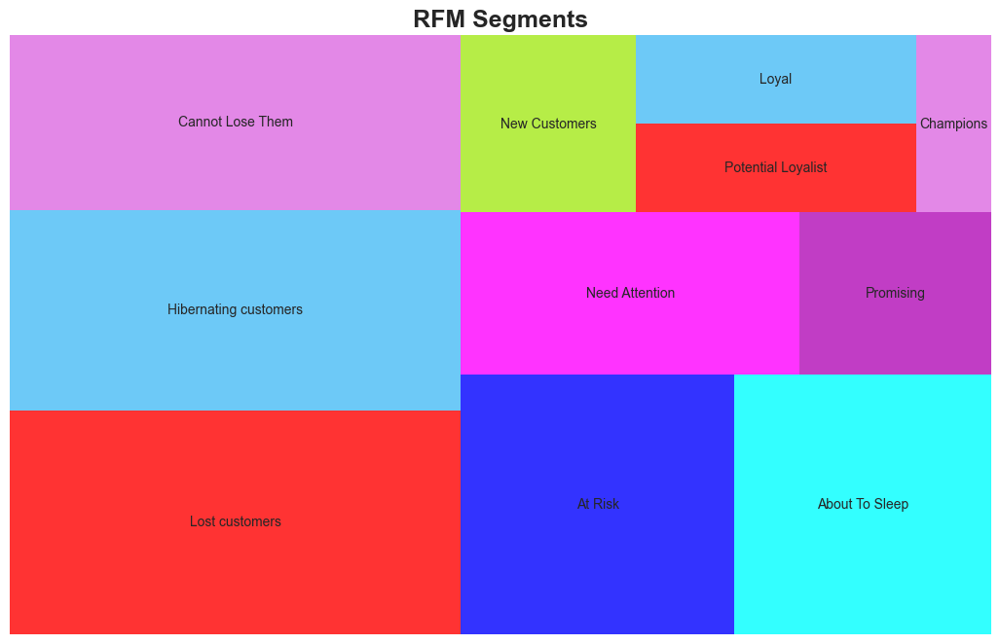

In [279]:
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(13, 8)
squarify.plot(sizes=segmentation['The Number Of Customer'], 
                      label=['Lost customers',
                              'Hibernating customers',
                              'Cannot Lose Them',
                              'At Risk',
                              'About To Sleep',
                              'Need Attention',
                              'Promising',
                              'New Customers',
                              'Potential Loyalist',
                              'Loyal',
                              'Champions'], 
                            alpha=0.8, 
                            color=["red", "#48BCF5", "#DD6AE1", "blue", "cyan", "magenta", '#B20CB7', "#A4E919"])
plt.title("RFM Segments", fontsize=18, fontweight="bold")
plt.axis('off')
plt.show()

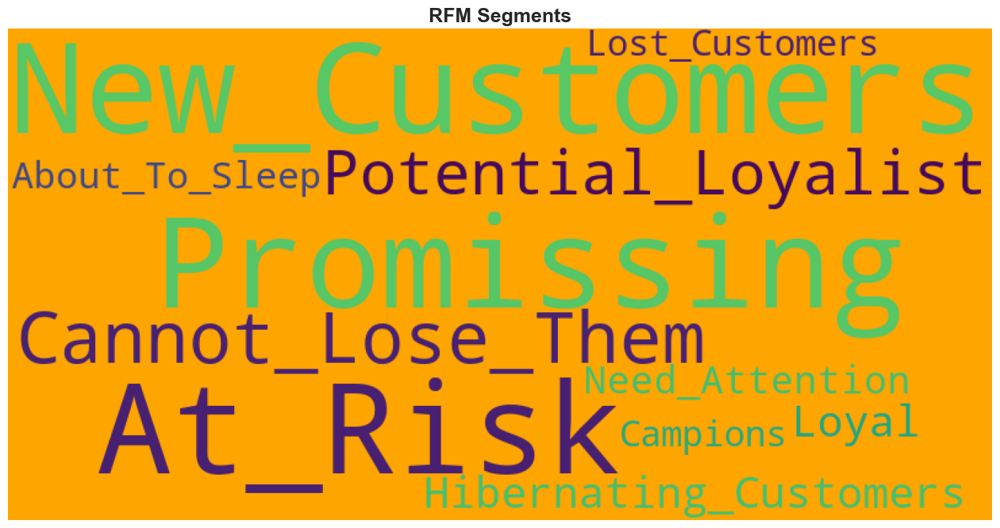

In [280]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

segment_text = segmentation["Customer Category"].str.split(" ").str.join("_")
all_segments = " ".join(segment_text)

wc = WordCloud(background_color="orange", 
               #max_words=250, 
               max_font_size=256, 
               random_state=42,
               width=800, height=400)
wc.generate(all_segments)
plt.figure(figsize = (16, 15))
plt.imshow(wc)
plt.title("RFM Segments", fontsize=18, fontweight="bold")
plt.axis('off')
plt.show()

In [281]:
fig = px.pie(df, 
             values = cus_data['Customer_Category'].value_counts(), 
             names = (cus_data["Customer_Category"].value_counts()).index, 
             title = 'Customer Category Distribution')
fig.show()

In [282]:
cus_data[cus_data['Customer_Category'] == 'At Risk']


,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category
0,1230001,905000.000,3,137,2,4,3,243,9,At Risk
5,1230006,174170000.000,9,109,2,5,5,255,12,At Risk
11,1230016,2940000.000,7,69,1,5,3,153,9,At Risk
23,1230031,215000.000,4,131,2,5,2,252,9,At Risk
24,1230032,29640000.000,2,131,2,3,4,234,9,At Risk
25,1230034,42240000.000,2,70,1,3,4,134,8,At Risk
34,1230050,13979000.000,11,116,2,5,4,254,11,At Risk
37,1230053,740000.000,6,64,1,5,2,152,8,At Risk
40,1230058,2165000.000,8,38,1,5,3,153,9,At Risk
49,1230073,240000.000,5,30,1,5,2,152,8,At Risk


In [283]:
cus_data.corr()

,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM_Sum
Monetary,1.000,0.303,-0.132,-0.125,0.264,0.612,0.447
Frequency,0.303,1.000,-0.288,-0.294,0.608,0.295,0.392
Recency,-0.132,-0.288,1.000,0.960,-0.356,-0.176,0.217
Recency_Score,-0.125,-0.294,0.960,1.000,-0.330,-0.154,0.269
Frequency_Score,0.264,0.608,-0.356,-0.330,1.000,0.381,0.672
Monetary_Score,0.612,0.295,-0.176,-0.154,0.381,1.000,0.728
RFM_Sum,0.447,0.392,0.217,0.269,0.672,0.728,1.000


In [284]:
from colorama import Fore, Style
from termcolor import colored
df_temp = cus_data.corr()

feature =[]
collinear=[]

for col in df_temp.columns:
    for i in df_temp.index:
        if (df_temp[col][i]> .85 and df_temp[col][i] < 1) or (df_temp[col][i]< -.85 and df_temp[col][i] > -1) :
                feature.append(col)
                collinear.append(i)
                print(Fore.RED + f"\033[1mmulticolinearity alert\033[0m between {col} - {i}")
        else:
            print(f"For {col} and {i}, there is \033[1mNO multicollinearity problem\033[0m") 

unique_list = list(set(feature+collinear))

print(colored('*'*80, 'cyan', attrs=['bold']))
print("\033[1mThe total number of strong corelated features:\033[0m", len(unique_list))

For Monetary and Monetary, there is NO multicollinearity problem
For Monetary and Frequency, there is NO multicollinearity problem
For Monetary and Recency, there is NO multicollinearity problem
For Monetary and Recency_Score, there is NO multicollinearity problem
For Monetary and Frequency_Score, there is NO multicollinearity problem
For Monetary and Monetary_Score, there is NO multicollinearity problem
For Monetary and RFM_Sum, there is NO multicollinearity problem
For Frequency and Monetary, there is NO multicollinearity problem
For Frequency and Frequency, there is NO multicollinearity problem
For Frequency and Recency, there is NO multicollinearity problem
For Frequency and Recency_Score, there is NO multicollinearity problem
For Frequency and Frequency_Score, there is NO multicollinearity problem
For Frequency and Monetary_Score, there is NO multicollinearity problem
For Frequency and RFM_Sum, there is NO multicollinearity problem
For Recency and Monetary, there is NO multicollin

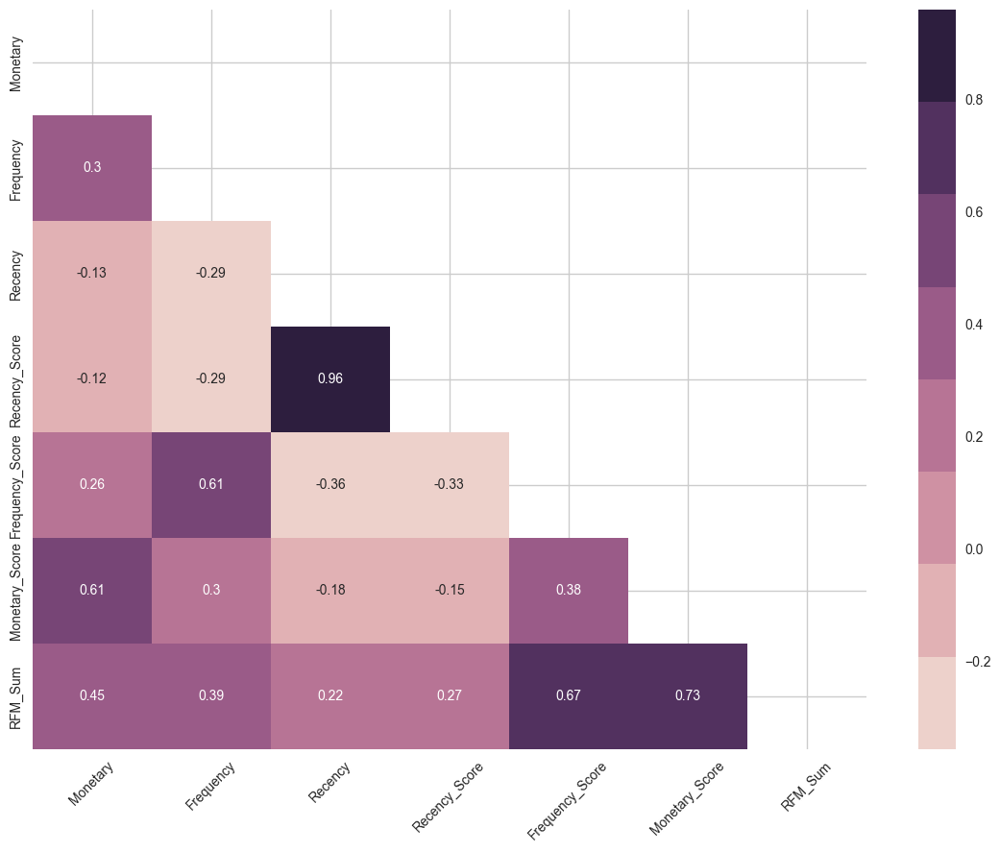

In [285]:
sns.set_style("whitegrid")
plt.figure(figsize=(14, 10))

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(cus_data.corr())

# using the upper triangle matrix as mask 
sns.heatmap(cus_data.corr(), annot=True, cmap = sns.cubehelix_palette(8), mask=matrix)

plt.xticks(rotation=45);

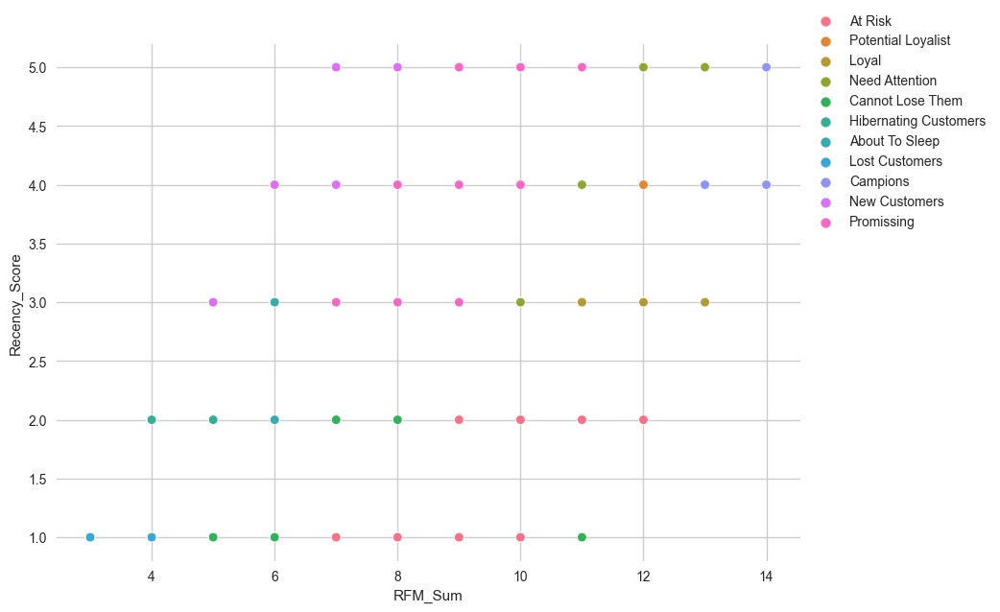

In [286]:
g = sns.scatterplot(data=cus_data, x="RFM_Sum", y="Recency_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

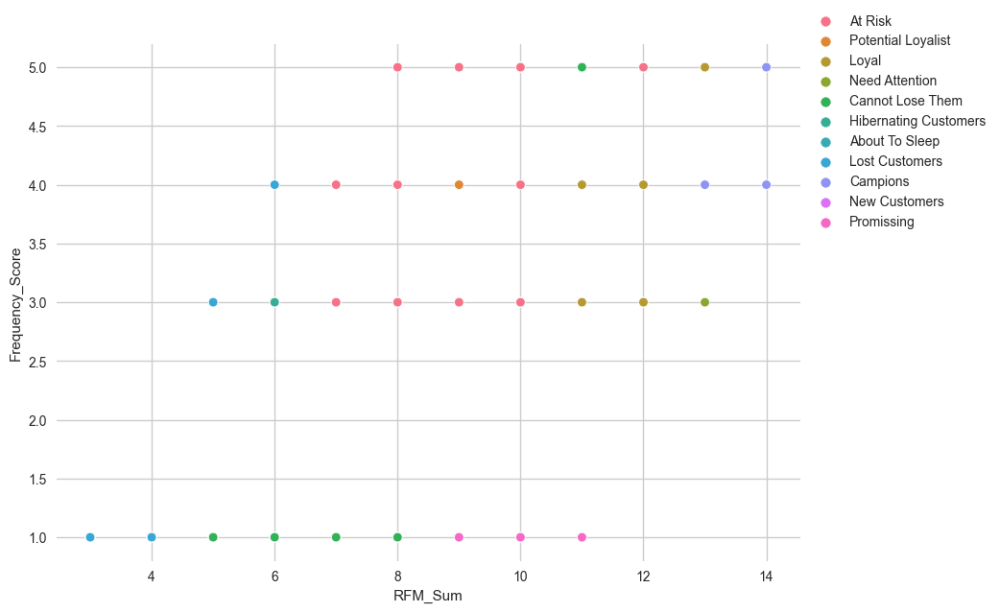

In [287]:
g = sns.scatterplot(data=cus_data, x="RFM_Sum", y="Frequency_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

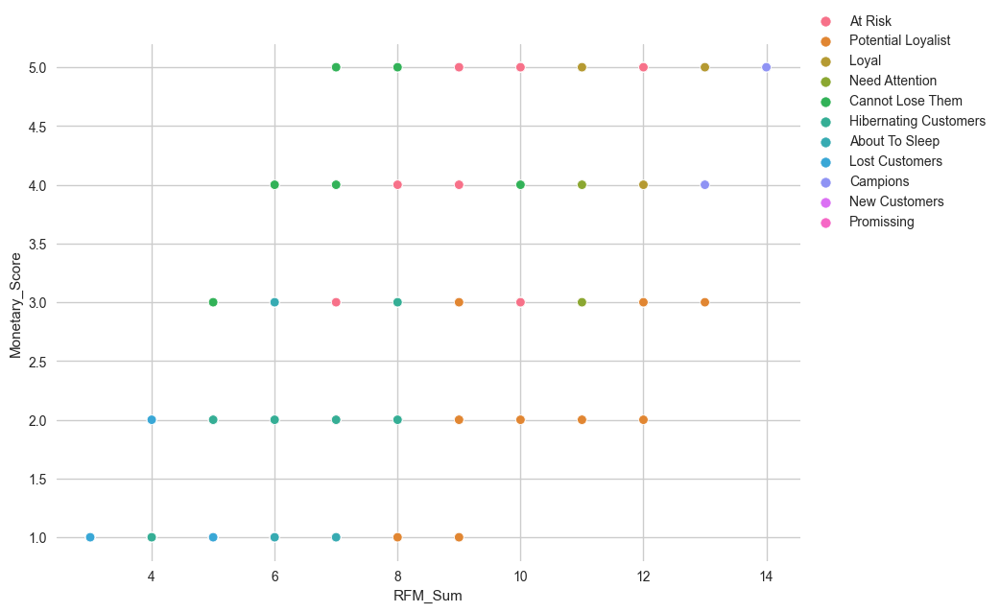

In [288]:
g = sns.scatterplot(data=cus_data, x="RFM_Sum", y="Monetary_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

<Figure size 2000x2000 with 0 Axes>

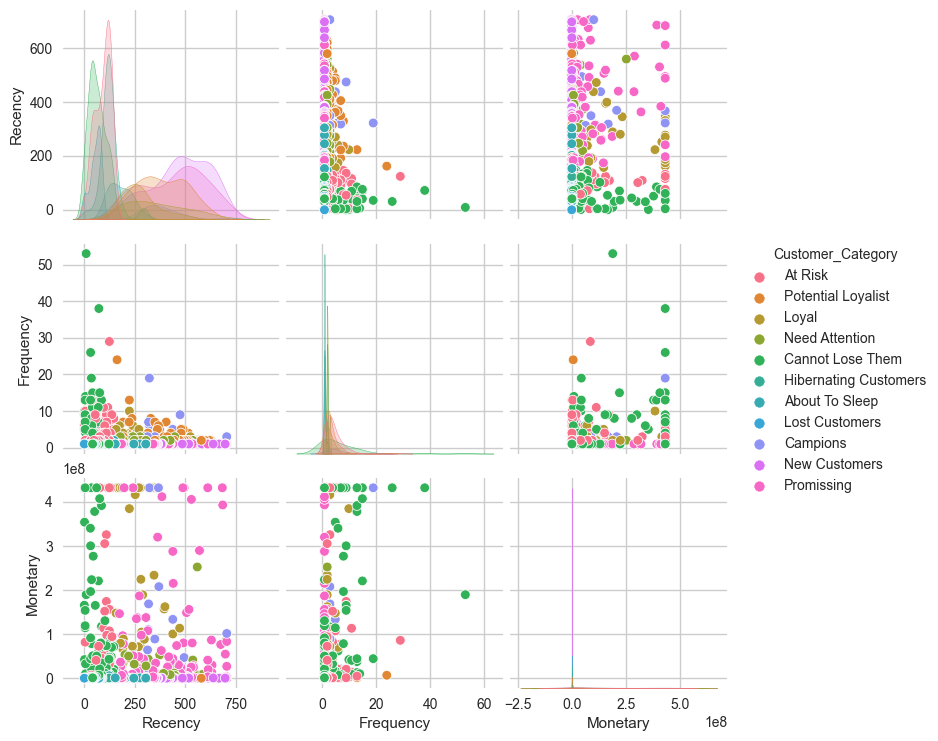

In [289]:
plt.figure(figsize=(20, 20))
sns.pairplot(cus_data[['Recency', 'Frequency', 'Monetary','Customer_Category']], hue='Customer_Category');

In [290]:
fig = px.scatter_matrix(cus_data, 
                        dimensions=['Recency', 'Frequency', 'Monetary'], 
                        color="Customer_Category",
                        width=1000, height=800)

fig.show()

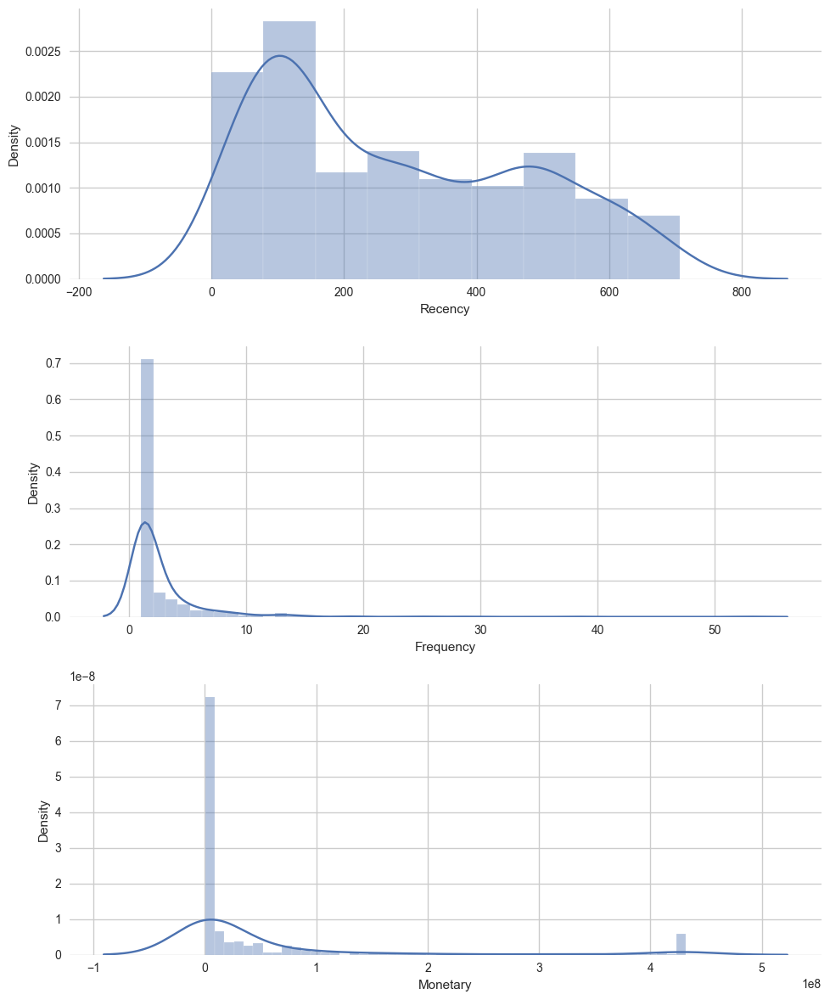

In [291]:
# plot the distribution of RFM values

f, ax = plt.subplots(figsize=(10, 12))
plt.subplot(3, 1, 1); sns.distplot(cus_data.Recency, label = 'Recency')
plt.subplot(3, 1, 2); sns.distplot(cus_data.Frequency, label = 'Frequency')
plt.subplot(3, 1, 3); sns.distplot(cus_data.Monetary, label = 'Monetary')
plt.style.use('fivethirtyeight')
plt.tight_layout()
plt.show()


In [292]:
rfm_rfm = cus_data[['Recency','Frequency','Monetary']]
print(rfm_rfm.describe())

       Recency  Frequency      Monetary
count  663.000    663.000       663.000
mean   276.819      2.712  51316414.811
std    198.507      3.902 111122090.267
min      0.000      1.000     60000.000
25%    110.000      1.000    300000.000
50%    238.000      1.000   2090000.000
75%    457.000      3.000  38046000.000
max    706.000     53.000 431943000.000


Data normalisasi

In [293]:
cus_data[['Recency', 'Frequency', 'Monetary']].sample(10)

,Recency,Frequency,Monetary
524,126,1,36685000.000
347,394,3,165000.000
280,405,2,755000.000
631,85,1,360000.000
582,32,1,660000.000
341,447,3,6670000.000
34,116,11,13979000.000
122,632,1,720000.000
22,162,4,431943000.000
398,240,3,995000.000


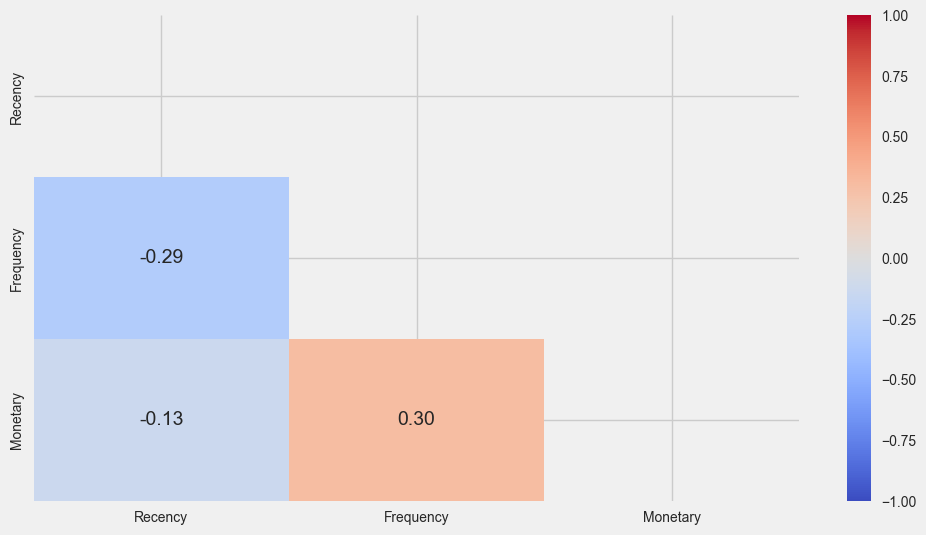

In [294]:
matrix = np.triu(cus_data[['Recency','Frequency','Monetary']].corr())
fig, ax = plt.subplots(figsize=(11, 6)) 
sns.heatmap (cus_data[['Recency','Frequency','Monetary']].corr(), 
             annot=True, 
             fmt= '.2f', 
             vmin=-1, 
             vmax=1, 
             center=0, 
             cmap='coolwarm',
             mask=matrix, 
             ax=ax);

In [295]:
# **Handling with Skewness - np.log**

skew_limit = 0.45 # This is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models. 
skew_vals = cus_data[['Recency', 'Frequency', 'Monetary']].skew()
skew_cols = skew_vals[abs(skew_vals)> skew_limit].sort_values(ascending=False)
skew_cols

Frequency   6.196
Monetary    2.638
Recency     0.470
dtype: float64

In [296]:
import plotly.express as px
import cufflinks as cf
cf.go_offline()
rfm_log = cus_data[skew_cols.index].copy()

for col in skew_cols.index.values:
    rfm_log[col] = rfm_log[col].apply(np.log1p)

    print(rfm_log.skew())
print()

rfm_log.iplot(kind='histogram', subplots=True, bins=50);

Frequency   1.694
Monetary    2.638
Recency     0.470
dtype: float64
Frequency   1.694
Monetary    0.224
Recency     0.470
dtype: float64
Frequency    1.694
Monetary     0.224
Recency     -1.565
dtype: float64



In [297]:
for skew in rfm_log.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   1.6944620518721274  means that the distribution is approx.   highly skewed 
A skewness value of   0.2241994181253659  means that the distribution is approx.   symmetric 
A skewness value of   -1.5652311986336873  means that the distribution is approx.   highly skewed 


In [298]:
rfm_log.head(10)

,Frequency,Monetary,Recency
0,1.386,13.716,4.927
1,1.609,15.391,5.557
2,1.099,19.884,5.849
3,1.099,17.176,5.841
4,2.773,19.212,4.263
5,2.303,18.976,4.700
6,3.989,19.060,2.303
7,3.219,15.730,5.094
8,1.099,12.301,5.652
9,1.792,14.842,5.094


In [299]:
# **Handling with Skewness - Power Transformer**
from sklearn.preprocessing import PowerTransformer
rfm_before_trans = cus_data[skew_cols.index].copy()
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(rfm_before_trans)
rfm_trans = pd.DataFrame(trans, columns =skew_cols.index )

print(rfm_trans.skew())
print()

Frequency    0.456
Monetary     0.061
Recency     -0.152
dtype: float64



In [300]:
# Interpreting Skewness 

for skew in rfm_trans.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   0.45613568056046744  means that the distribution is approx.   symmetric 
A skewness value of   0.06121855638560715  means that the distribution is approx.   symmetric 
A skewness value of   -0.15177495303320393  means that the distribution is approx.   symmetric 


In [301]:
rfm_log.iplot(kind='histogram',subplots=True,bins=50);

In [302]:
rfm_trans.iplot(kind='histogram', subplots=True, bins=50);

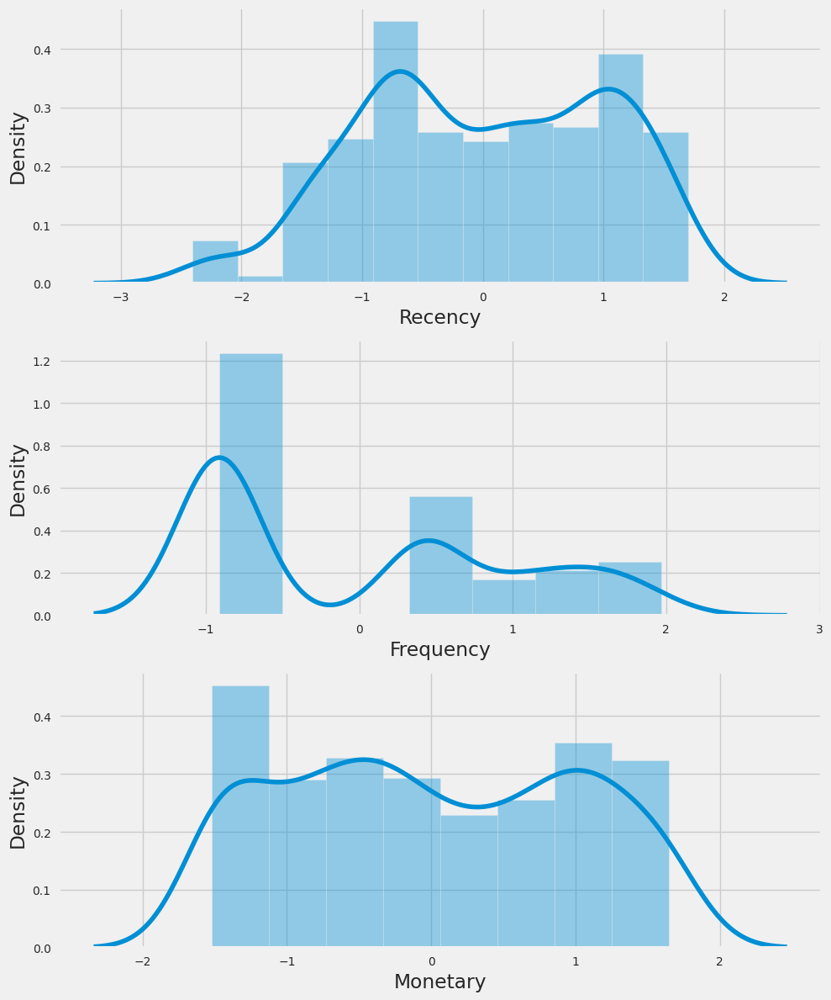

In [303]:
f, ax = plt.subplots(figsize=(10, 12))
plt.subplot(3, 1, 1); sns.distplot(rfm_trans.Recency, label = 'Recency')
plt.subplot(3, 1, 2); sns.distplot(rfm_trans.Frequency, label = 'Frequency')
plt.subplot(3, 1, 3); sns.distplot(rfm_trans.Monetary, label = 'Monetary')
plt.style.use('default')
plt.tight_layout()
plt.show()

In [304]:
rfm_trans.head()

,Frequency,Monetary,Recency
0,0.980,-0.393,-0.547
1,1.270,0.228,0.133
2,0.425,1.647,0.519
3,0.425,0.832,0.507
4,1.866,1.455,-1.084


In [305]:
fig = px.scatter_3d(rfm_trans, 
                    x='Recency',
                    y='Frequency',
                    z='Monetary',
                    color='Frequency')
fig.show();

## Run K-Means menggunakan nilai K yang optimal

In [306]:
# prediction was added

kmeans = KMeans(n_clusters = 3).fit(X_scaled)
kmeans.fit_predict(X_scaled)
labels = kmeans.labels_
rfm_trans['ClusterID']=labels
rfm_trans.sample(10)

,Frequency,Monetary,Recency,ClusterID
285,0.425,1.259,0.988,2
301,-0.911,-1.485,1.012,2
425,0.425,1.136,-0.595,1
358,-0.911,1.354,1.142,2
550,0.425,-1.199,-0.487,1
102,0.425,-0.715,1.180,2
279,-0.911,0.945,1.430,2
650,-0.911,1.009,-1.175,1
391,0.425,-0.146,0.079,1
67,1.853,0.486,-2.085,1


In [307]:
rfm_trans.ClusterID.value_counts()

1    374
2    232
0     57
Name: ClusterID, dtype: int64

In [308]:
fig = px.pie(df, values = rfm_trans['ClusterID'].value_counts(), 
             names = (rfm_trans['ClusterID'].value_counts()).index, 
             title = 'Predicted Clusters Distribution')
fig.show()

In [309]:
cus_data['ClusterID'] = labels
cus_data.sample(15)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category,ClusterID
330,1230743,11605000.000,2,444,4,3,4,434,11,Need Attention,2
604,1231622,60000.000,1,109,2,1,1,211,4,Hibernating Customers,1
589,1231567,970000.000,4,109,2,5,3,253,10,At Risk,1
220,1230424,207640000.000,3,369,4,4,5,445,13,Campions,0
309,1230688,315000.000,1,478,4,1,2,412,7,New Customers,2
512,1231319,44280000.000,13,31,1,5,4,154,10,Cannot Lose Them,1
294,1230645,1135000.000,4,52,1,5,3,153,9,At Risk,1
256,1230525,65000.000,1,511,5,1,1,511,7,New Customers,2
107,1230185,431943000.000,1,494,5,1,5,515,11,Promissing,0
282,1230600,3240000.000,1,611,5,1,3,513,9,Promissing,2


IndexError: index 2 is out of bounds for axis 1 with size 2

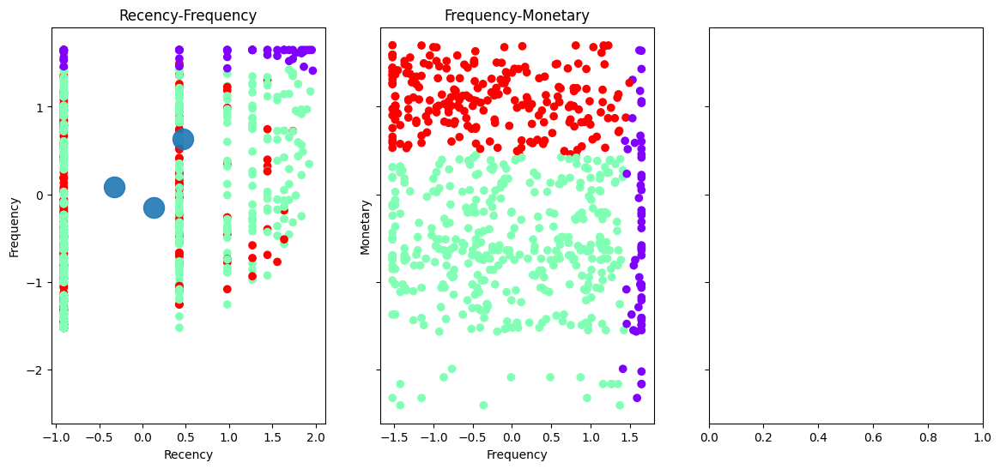

In [310]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(14, 6)) # sharey=True ile y eksen labels lari ortak kullanirlar.

ax1.set_title('Recency-Frequency')
ax1.set_xlabel('Recency')
ax1.set_ylabel('Frequency')
ax1.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 1], c=kmeans.labels_, cmap="rainbow")
ax1.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, alpha=0.9, label = 'Centroids')

ax2.set_title("Frequency-Monetary")
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Monetary')
ax2.scatter(rfm_trans.iloc[:, 1], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax2.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s=300, alpha=0.9, label = 'Centroids')

ax3.set_title("Recency-Monetary")
ax3.set_xlabel('Recency')
ax3.set_ylabel('Monetary')
ax3.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax3.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 2], s=300, alpha=0.9, label = 'Centroids')

In [ ]:
##cus_data.to_excel("Hasil Sementara2.xlsx")

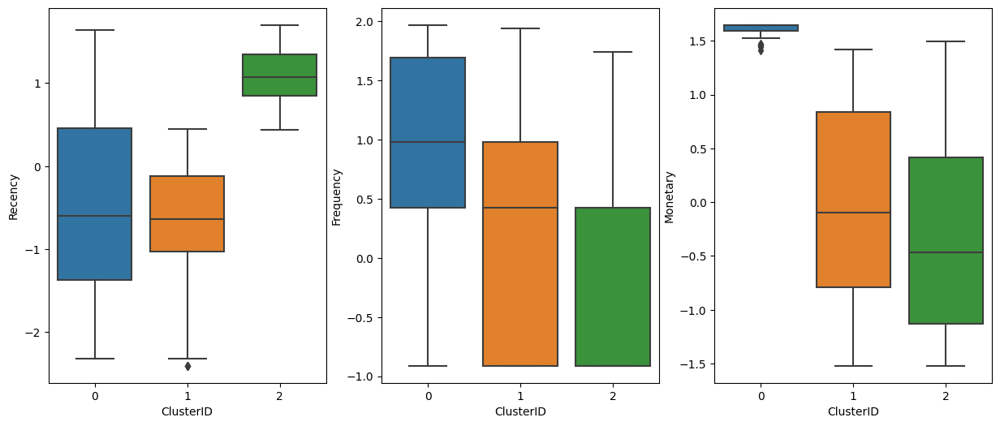

In [ ]:
plt.figure(figsize=(15,6))

plt.subplot(1, 3, 1)
sns.boxplot(x=rfm_trans['ClusterID'], y=rfm_trans['Recency'])

plt.subplot(1, 3, 2)
sns.boxplot(x=rfm_trans['ClusterID'], y=rfm_trans['Frequency'])

plt.subplot(1, 3, 3)
sns.boxplot(x=rfm_trans['ClusterID'], y=rfm_trans['Monetary'])
plt.show()

In [ ]:
for i in rfm_trans.drop("ClusterID", axis=1):
    rfm_trans[i].iplot(kind="box", title=i, boxpoints="all", color='lightseagreen')

In [330]:
def map_segment(cluster_id):
    if cluster_id == 0:
        return 'Premium Shoppers'
    elif cluster_id == 1:
        return 'Regular Customers'
    elif cluster_id == 2:
        return 'Inactive Customers'
    else:
        return 'Unknown Segment'

# Menambahkan kolom "K-Means Segments" ke DataFrame cust_data
cus_data['K-Means Segments'] = cus_data['ClusterID'].apply(map_segment)

In [331]:
cus_data.sample(10)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category,ClusterID,K-Means Segments
235,1230471,1400000.000,2,514,5,3,3,533,11,Potential Loyalist,2,Inactive Customers
534,1231392,146400000.000,1,174,3,1,5,315,9,Promissing,1,Regular Customers
260,1230542,825000.000,5,116,2,5,2,252,9,At Risk,1,Regular Customers
224,1230435,1210000.000,2,367,4,3,3,433,10,Potential Loyalist,2,Inactive Customers
140,1230242,27030000.000,1,705,5,1,4,514,10,Promissing,2,Inactive Customers
176,1230331,3600000.000,2,370,4,3,3,433,10,Potential Loyalist,2,Inactive Customers
19,1230025,585000.000,7,192,3,5,2,352,10,Potential Loyalist,1,Regular Customers
566,1231508,28000000.000,2,305,3,3,4,334,10,Need Attention,1,Regular Customers
431,1231110,75000.000,1,299,3,1,1,311,5,New Customers,1,Regular Customers
69,1230104,455000.000,2,576,5,3,2,532,10,Potential Loyalist,2,Inactive Customers


In [332]:
cus_data[cus_data['ClusterID'] == 0].sample(10)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category,ClusterID,K-Means Segments
109,1230190,391620000.000,13,85,1,5,5,155,11,Cannot Lose Them,0,Premium Shoppers
467,1231202,431943000.000,4,129,2,5,5,255,12,At Risk,0,Premium Shoppers
101,1230171,233680000.000,2,345,4,3,5,435,12,Loyal,0,Premium Shoppers
539,1231414,431943000.000,2,132,2,3,5,235,10,At Risk,0,Premium Shoppers
394,1230923,411740000.000,1,384,4,1,5,415,10,Promissing,0,Premium Shoppers
29,1230042,431943000.000,2,331,4,3,5,435,12,Loyal,0,Premium Shoppers
242,1230481,431943000.000,6,174,3,5,5,355,13,Loyal,0,Premium Shoppers
420,1231079,340200000.000,6,30,1,5,5,155,11,Cannot Lose Them,0,Premium Shoppers
163,1230298,276790500.000,8,44,1,5,5,155,11,Cannot Lose Them,0,Premium Shoppers
492,1231267,431943000.000,1,241,3,1,5,315,9,Promissing,0,Premium Shoppers


In [333]:
cus_data[cus_data['ClusterID'] == 1].sample(10)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category,ClusterID,K-Means Segments
603,1231621,10335000.000,1,109,2,1,4,214,7,Cannot Lose Them,1,Regular Customers
374,1230865,310000.000,2,116,2,3,2,232,7,Hibernating Customers,1,Regular Customers
546,1231431,7560000.000,1,94,2,1,4,214,7,Cannot Lose Them,1,Regular Customers
230,1230447,160000.000,2,111,2,3,1,231,6,About To Sleep,1,Regular Customers
417,1231073,5580000.000,2,283,3,3,3,333,9,Potential Loyalist,1,Regular Customers
549,1231449,1600000.000,2,124,2,3,3,233,8,Hibernating Customers,1,Regular Customers
654,1231763,2520000.000,1,58,1,1,3,113,5,Cannot Lose Them,1,Regular Customers
37,1230053,740000.000,6,64,1,5,2,152,8,At Risk,1,Regular Customers
455,1231172,21600000.000,1,270,3,1,4,314,8,Promissing,1,Regular Customers
80,1230131,45630000.000,4,227,3,5,4,354,12,Loyal,1,Regular Customers


In [334]:
cus_data[cus_data['ClusterID'] == 2].sample(10)

,ID,Monetary,Frequency,Recency,Recency_Score,Frequency_Score,Monetary_Score,RFM Score,RFM_Sum,Customer_Category,ClusterID,K-Means Segments
102,1230172,400000.000,2,530,5,3,2,532,10,Potential Loyalist,2,Inactive Customers
157,1230281,2090000.000,1,599,5,1,3,513,9,Promissing,2,Inactive Customers
164,1230304,422000.000,2,510,5,3,2,532,10,Potential Loyalist,2,Inactive Customers
219,1230418,162157000.000,2,399,4,3,5,435,12,Loyal,2,Inactive Customers
214,1230410,9000000.000,1,491,5,1,4,514,10,Promissing,2,Inactive Customers
336,1230750,172000.000,1,427,4,1,1,411,6,New Customers,2,Inactive Customers
159,1230287,2570000.000,2,597,5,3,3,533,11,Potential Loyalist,2,Inactive Customers
277,1230588,220000.000,1,642,5,1,2,512,8,New Customers,2,Inactive Customers
176,1230331,3600000.000,2,370,4,3,3,433,10,Potential Loyalist,2,Inactive Customers
3,1230004,28800000.000,2,343,4,3,4,434,11,Need Attention,2,Inactive Customers


In [335]:
rfm_trans.shape

(663, 4)

In [336]:
df.shape

(1798, 7)

In [337]:
X.shape

(663, 3)

In [338]:
cus_data['Customer_Category'].value_counts()

New Customers            114
Promissing               102
At Risk                   89
Cannot Lose Them          80
Potential Loyalist        75
Hibernating Customers     62
Loyal                     35
Need Attention            35
About To Sleep            28
Lost Customers            28
Campions                  15
Name: Customer_Category, dtype: int64

In [ ]:

# customer_rfm = customer_rfm.join(extracted_col)
#cus_data['K-Means Segments'] = rfm_trans['Labels'].values
#cus_data.sample(8)

In [339]:
RFM_Customer_Segment = pd.DataFrame(cus_data['Customer_Category'].value_counts(dropna=False).sort_values(ascending=False))
RFM_Customer_Segment.reset_index(inplace=True)
RFM_Customer_Segment.rename(columns={'index':'RFM Customer Segment', 'Customer_Category':'The Number Of Customer'}, inplace=True)
RFM_Customer_Segment

,RFM Customer Segment,The Number Of Customer
0,New Customers,114
1,Promissing,102
2,At Risk,89
3,Cannot Lose Them,80
4,Potential Loyalist,75
5,Hibernating Customers,62
6,Loyal,35
7,Need Attention,35
8,About To Sleep,28
9,Lost Customers,28


In [340]:
cus_data['K-Means Segments'].value_counts()

Regular Customers     374
Inactive Customers    232
Premium Shoppers       57
Name: K-Means Segments, dtype: int64

In [341]:
cus_data['ClusterID'].value_counts()

1    374
2    232
0     57
Name: ClusterID, dtype: int64

In [342]:
KMeans_Predicted_Clusters = pd.DataFrame(cus_data['K-Means Segments'].value_counts(dropna=False).sort_values(ascending=False))
KMeans_Predicted_Clusters.reset_index(inplace=True)
KMeans_Predicted_Clusters.rename(columns={'index':'K-Means Segments', 'K-Means Segments':'The Number Of Customer'}, inplace=True)
KMeans_Predicted_Clusters

,K-Means Segments,The Number Of Customer
0,Regular Customers,374
1,Inactive Customers,232
2,Premium Shoppers,57


In [343]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=cus_data['K-Means Segments'].values,
    y=cus_data['K-Means Segments'].index,
    name='Predicted-Clusters By K-Means',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x=cus_data['Customer_Category'].values,
    y=cus_data['Customer_Category'].index,
    name='Customer-Segment By RFM Analysis',
    marker_color='lightsalmon'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='relative', 
                  xaxis_tickangle=-45, 
                  title="The Comparison of Predicted-Clusters By K-Means vs Customer-Segment By RFM Analysis")
fig.update_traces(dict(marker_line_width=0))
fig.show()

In [ ]:
#cus_data.to_excel("Hasil Segmentasi Final.xlsx")

In [344]:
df2 = pd.read_csv("daftar-pelanggan.csv")

In [345]:
df2.head(10)

,ID,Nama Pelanggan
0,1230001,rizki
1,1230002,indra
2,1230003,basamo
3,1230004,risma
4,1230005,farly
5,1230006,umkm
6,1230007,pwkshrt
7,1230008,pathcloth
8,1230009,januar
9,1230010,azis


In [327]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


In [346]:
from pandas_profiling import ProfileReport
report = ProfileReport(cus_data, title="Report", html={'style': {'full_width':True}}, explorative=True, missing_diagrams={'bar': True})

In [348]:
report.to_notebook_iframe()